# Preprocessing Data

### Import Library

In [1]:
import os
import pandas as pd
import numpy as np
from scipy.signal import savgol_filter
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import matplotlib.pyplot as plt
import math

### Plot Data Awal

In [33]:
def plot_grid(jenis_senyawa, data_type, stage, n_cols=5, n_file=40):
    folder_map = {
        'raw': '../Data'
    }
    # ➜ Untuk filtered, foldernya bisa "Etanol_Filtered"
    folder_path = f"{folder_map[stage]}/{stage}/"
    total_files = n_file
    n_rows = math.ceil(total_files / n_cols)

    color = 'blue' if data_type == 'TVOC' else 'red'
    y_label = 'TVOC (ppb)' if data_type == 'TVOC' else 'TCD (mV)'

    plt.figure(figsize=(n_cols * 4.5, n_rows * 3))

    for i in range(1, total_files + 1):
        filename = f"{jenis_senyawa}/{jenis_senyawa}_{stage}_{i}.csv"
        filepath = os.path.join(folder_path, filename)

        try:
            df = pd.read_csv(filepath)
            x = df['Time (s)']
            y = df[y_label]

            ax = plt.subplot(n_rows, n_cols, i)
            ax.plot(x, y, color=color, label=f'{data_type}')
            ax.set_title(f'{jenis_senyawa} {stage.capitalize()} {i}', fontsize=9)
            ax.set_xlabel('Time (s)', fontsize=8)
            ax.set_ylabel(y_label, fontsize=8)
            ax.tick_params(labelsize=7)
            ax.legend(fontsize=6, loc='best')
            ax.grid(True)

        except Exception as e:
            print(f"Gagal muat {filename}: {e}")

    plt.suptitle(f'{jenis_senyawa} - {data_type} ({stage.capitalize()})', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

def plot1():
    senyawa = ['butana', 'spirtus']
    sensor =  ['TVOC', 'TCD']

    for i in senyawa :
        for j in sensor :
            plot_grid(i, j, 'raw')

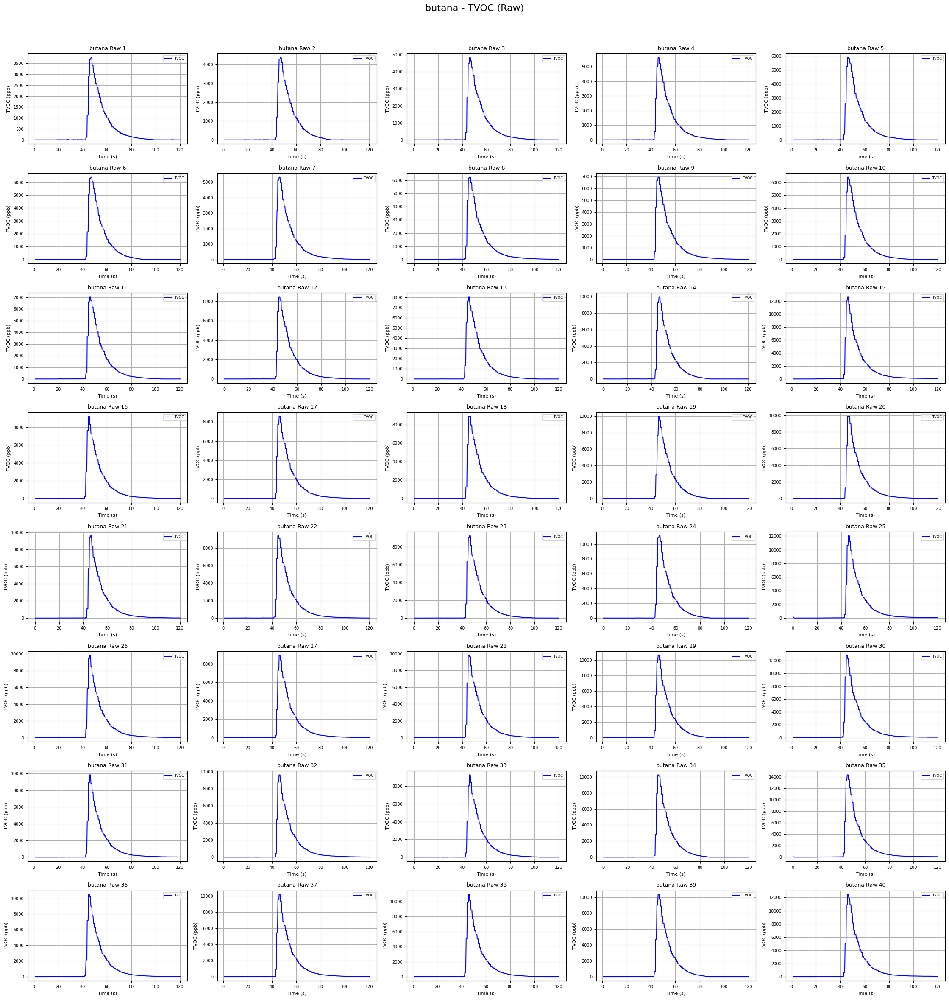

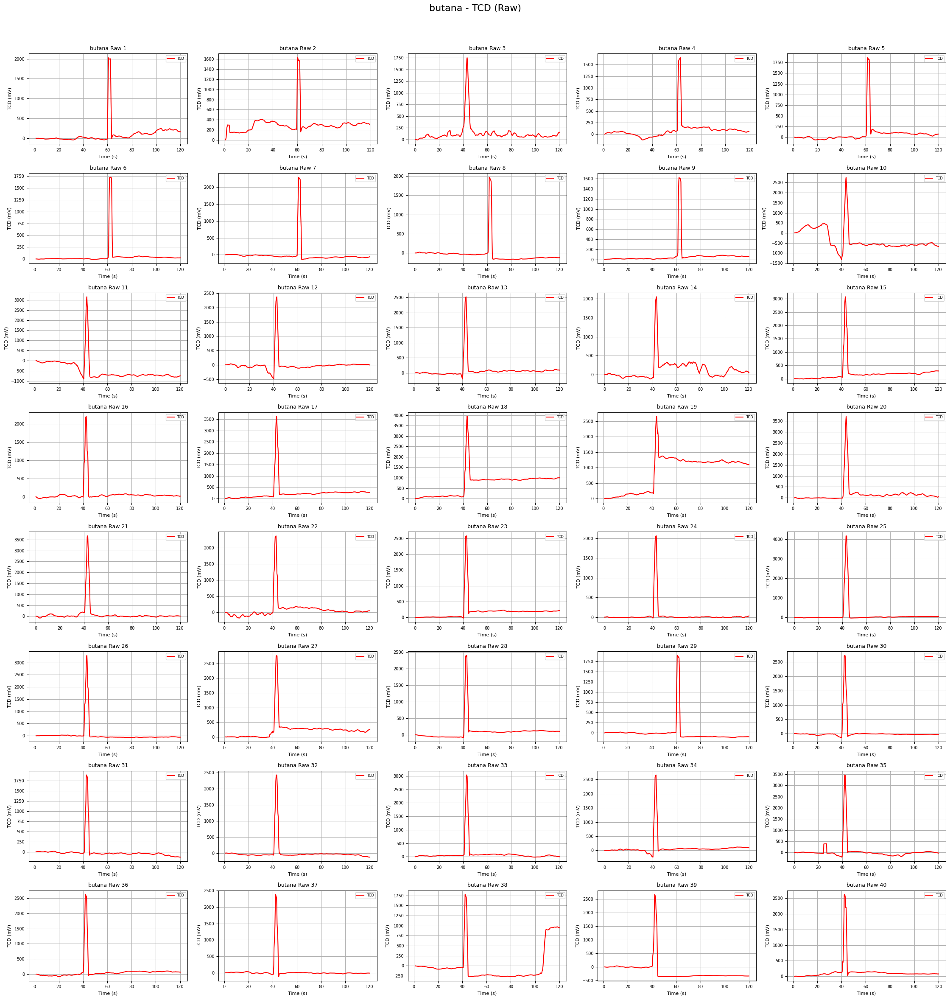

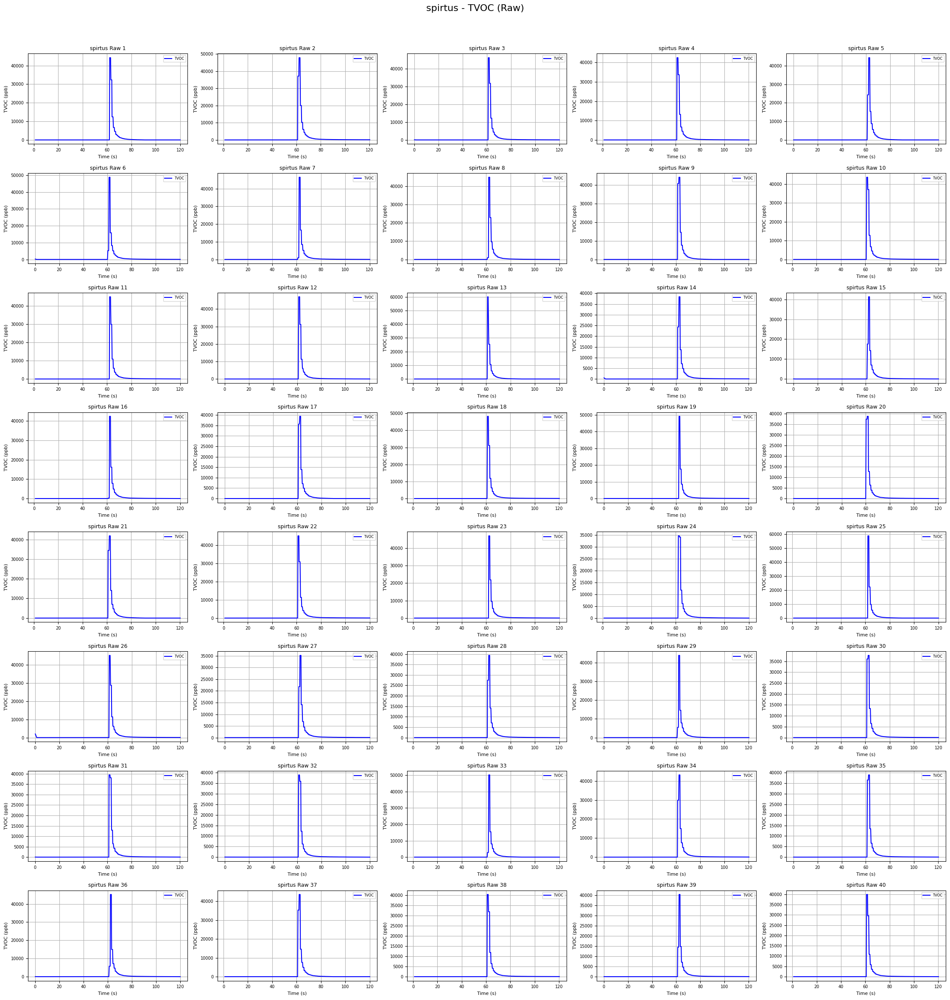

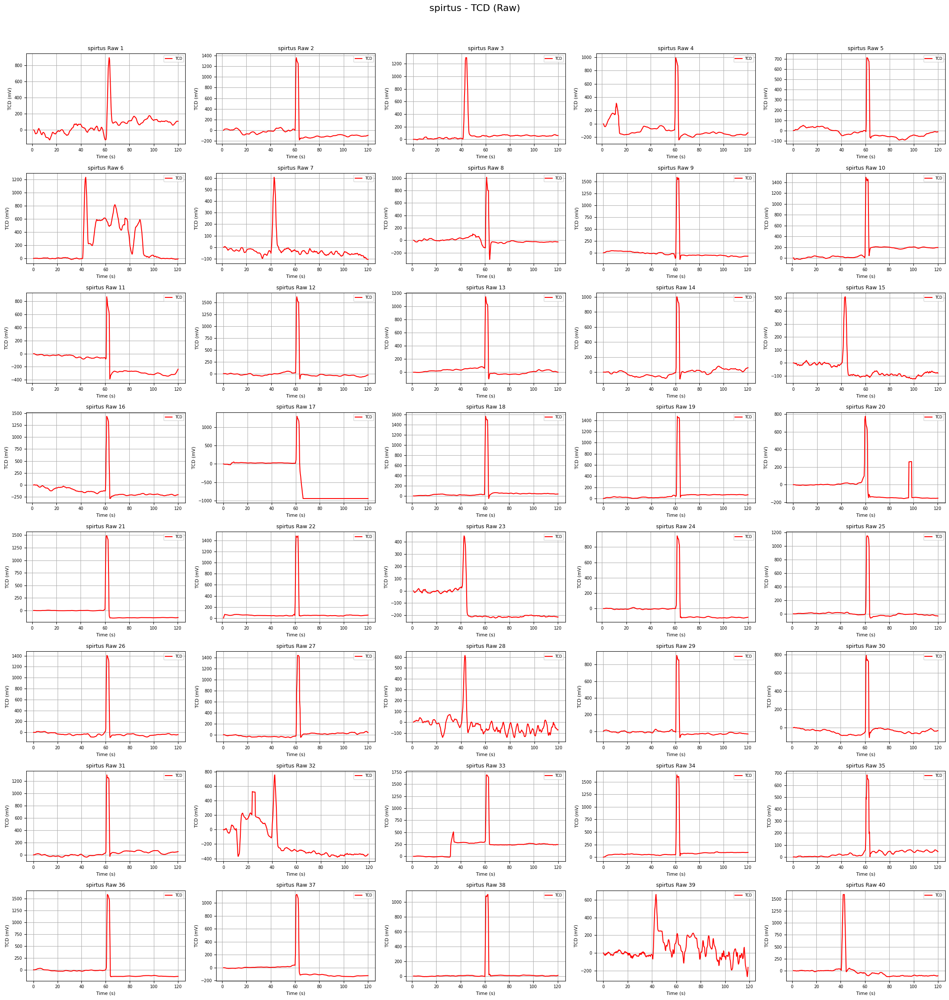

In [34]:
plot1()

In [35]:
# for i in range (1, 41) :
#     data = pd.read_csv(f'raw_data/propana/propana_raw_120_{i}.csv')
#     print(f'data {i} = {data.shape}')

### Defini class processing data

In [36]:
class PreprocessingPipeline:
    def __init__(self, senyawa_list=['butana', 'spirtus'], n_files=40,
                 total_duration=120, cut_after=80,
                 window_length=21, polyorder=2):
        self.senyawa_list = senyawa_list
        self.n_files = n_files
        self.total_duration = total_duration
        self.cut_after = cut_after
        self.time_cut_start = total_duration - cut_after
        self.window_length = window_length
        self.polyorder = polyorder
        self.scaler = None

    def trim(self):
        for senyawa in self.senyawa_list:
            for i in range(1, self.n_files + 1):
                raw_path = f"../Data/raw/{senyawa}/{senyawa}_raw_{i}.csv"
                trimmed_path = f"../Data/trimmed/{senyawa}/{senyawa}_trimmed_{i}.csv"
                os.makedirs(os.path.dirname(trimmed_path), exist_ok=True)
                df = pd.read_csv(raw_path)
                trimmed_df = df[df['Time (s)'] >= self.time_cut_start].copy()
                trimmed_df['Time (s)'] -= self.time_cut_start
                trimmed_df.to_csv(trimmed_path, index=False)
        print("✅ Trimmed data saved")

    def refine(self):
        for senyawa in self.senyawa_list:
            for i in range(1, self.n_files + 1):
                trimmed_path = f"../Data/trimmed/{senyawa}/{senyawa}_trimmed_{i}.csv"
                refined_path = f"../Data/refined/{senyawa}/{senyawa}_refined_{i}.csv"
                os.makedirs(os.path.dirname(refined_path), exist_ok=True)
                df = pd.read_csv(trimmed_path)
                refined_df = df.loc[0:312]
                refined_df = df.dropna()
                refined_df.to_csv(refined_path, index=False)
        print("✅ Refined data saved")

    def filter(self):
        for senyawa in self.senyawa_list:
            for i in range(1, self.n_files + 1):
                refined_path = f"../Data/refined/{senyawa}/{senyawa}_refined_{i}.csv"
                filtered_path = f"../Data/filtered/{senyawa}/{senyawa}_filtered_{i}.csv"
                os.makedirs(os.path.dirname(filtered_path), exist_ok=True)
                df = pd.read_csv(refined_path)
                if len(df) > self.window_length:
                    df['TCD (mV)'] = savgol_filter(df['TCD (mV)'], self.window_length, self.polyorder)
                    df['TVOC (ppb)'] = savgol_filter(df['TVOC (ppb)'], self.window_length, self.polyorder)
                df.to_csv(filtered_path, index=False)
        print("✅ Filtered data saved")

    def fit_scaler(self):
        all_data = []
        for senyawa in self.senyawa_list:
            for i in range(1, self.n_files + 1):
                filtered_path = f"../Data/filtered/{senyawa}/{senyawa}_filtered_{i}.csv"
                df = pd.read_csv(filtered_path)
                all_data.append(df[['TCD (mV)', 'TVOC (ppb)']])
        combined = pd.concat(all_data, ignore_index=True)
        self.scaler = StandardScaler().fit(combined)
        print("✅ Scaler fitted")

    def normalize(self, filtered=True):
        for senyawa in self.senyawa_list:
            for i in range(1, self.n_files + 1):
                if filtered:
                    source = f"../Data/filtered/{senyawa}/{senyawa}_filtered_{i}.csv"
                    out_name = f"{senyawa}_normalized_filtered_{i}.csv"
                    out_folder = f"../Data/normalized_filtered/{senyawa}/"
                else:
                    source = f"../Data/refined/{senyawa}/{senyawa}_refined_{i}.csv"
                    out_name = f"{senyawa}_normalized_nonfiltered_{i}.csv"
                    out_folder = f"../Data/normalized_nonfiltered/{senyawa}/"
    
                os.makedirs(out_folder, exist_ok=True)
                df = pd.read_csv(source)
                df[['TCD (mV)', 'TVOC (ppb)']] = self.scaler.transform(df[['TCD (mV)', 'TVOC (ppb)']])
                df.to_csv(os.path.join(out_folder, out_name), index=False)
        print("✅ Normalized data saved")

    def run_refined_only(self):
        self.trim()
        self.refine()
        self.fit_scaler()
        self.normalize(filtered=False)
    
    def run_filtered(self):
        self.trim()
        self.refine()
        self.filter()
        self.fit_scaler()
        self.normalize(filtered=True)

### Jalankan Pipeline

In [37]:
pipeline = PreprocessingPipeline()
pipeline.run_filtered()
pipeline.run_refined_only()

✅ Trimmed data saved
✅ Refined data saved
✅ Filtered data saved
✅ Scaler fitted
✅ Normalized data saved
✅ Trimmed data saved
✅ Refined data saved
✅ Scaler fitted
✅ Normalized data saved


### Fungsi Plot Grid General

In [38]:
def plot_grid(jenis_senyawa, data_type, stage, n_cols=5, n_file=40):
    folder_map = {
        'raw': 'raw',
        'trimmed': 'trimmed',
        'refined': 'refined',
        'filtered': 'filtered',
        'normalized_filtered': 'normalized_filtered',
        'normalized_nonfiltered': 'normalized_nonfiltered'
    }
    
    folder_path = f"../Data/{folder_map[stage]}/{jenis_senyawa}/"
    total_files = n_file
    n_rows = math.ceil(total_files / n_cols)

    color = 'blue' if data_type == 'TVOC' else 'red'
    y_label = 'TVOC (ppb)' if data_type == 'TVOC' else 'TCD (mV)'

    plt.figure(figsize=(n_cols * 4.5, n_rows * 3))

    for i in range(1, total_files + 1):
        filename = f"{jenis_senyawa}_{stage}_{i}.csv"
        filepath = os.path.join(folder_path, filename)

        try:
            df = pd.read_csv(filepath)
            x = df['Time (s)']
            y = df[y_label]

            ax = plt.subplot(n_rows, n_cols, i)
            ax.plot(x, y, color=color, label=f'{data_type}')
            ax.set_title(f'{jenis_senyawa} {stage.capitalize()} {i}', fontsize=9)
            ax.set_xlabel('Time (s)', fontsize=8)
            ax.set_ylabel(y_label, fontsize=8)
            ax.tick_params(labelsize=7)
            ax.legend(fontsize=6, loc='best')
            ax.grid(True)

        except Exception as e:
            print(f"Gagal muat {filename}: {e}")

    plt.suptitle(f'{jenis_senyawa} - {data_type} ({stage.capitalize()})', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

### Plot Semua Tahap

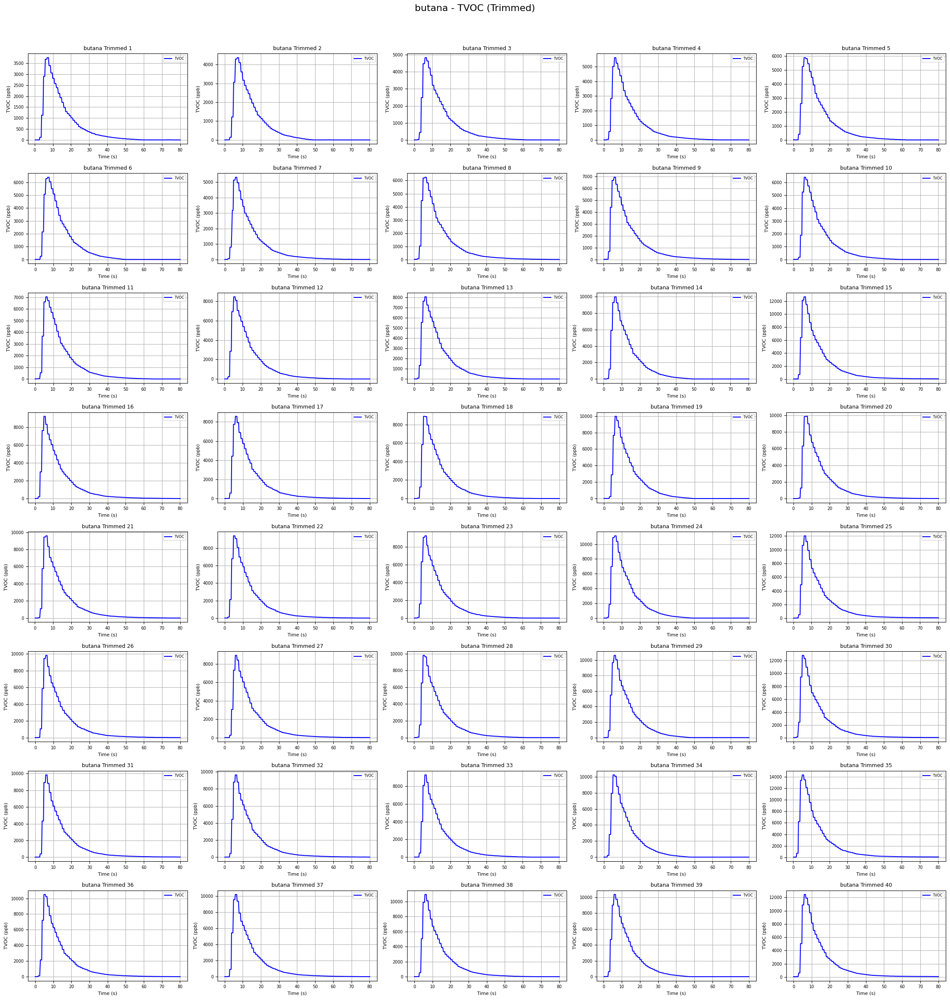

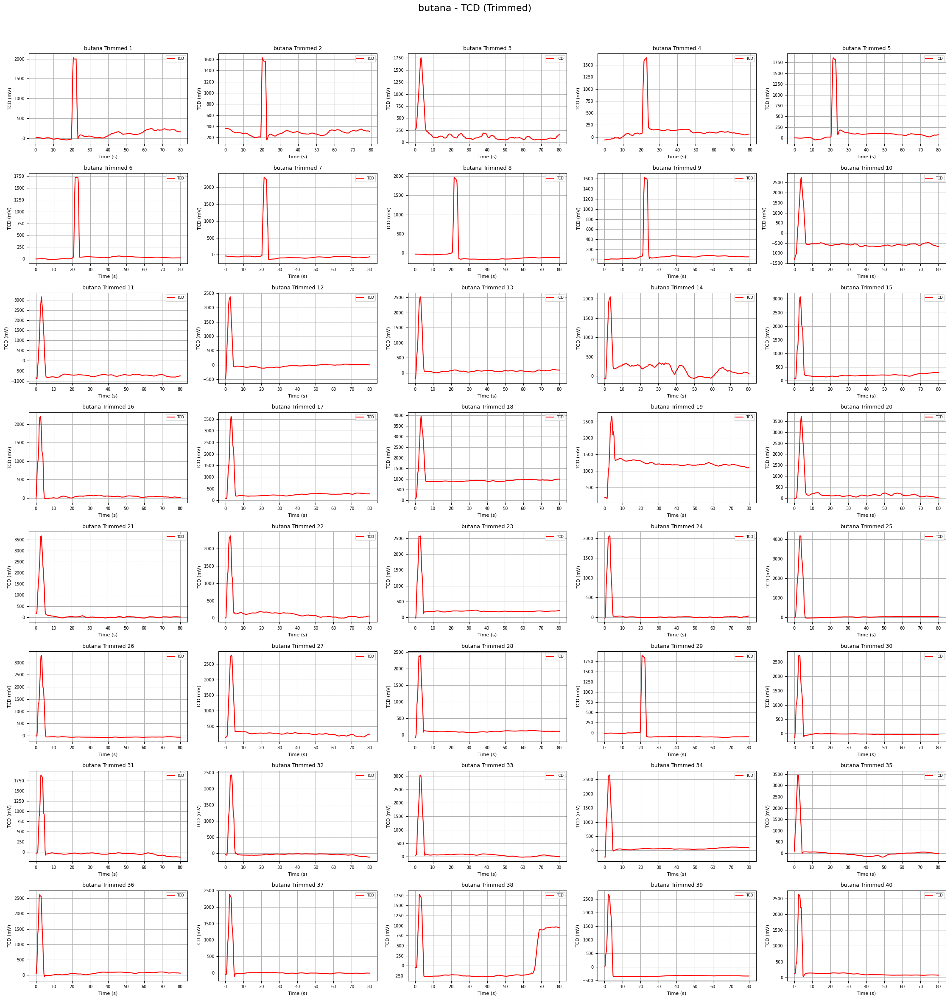

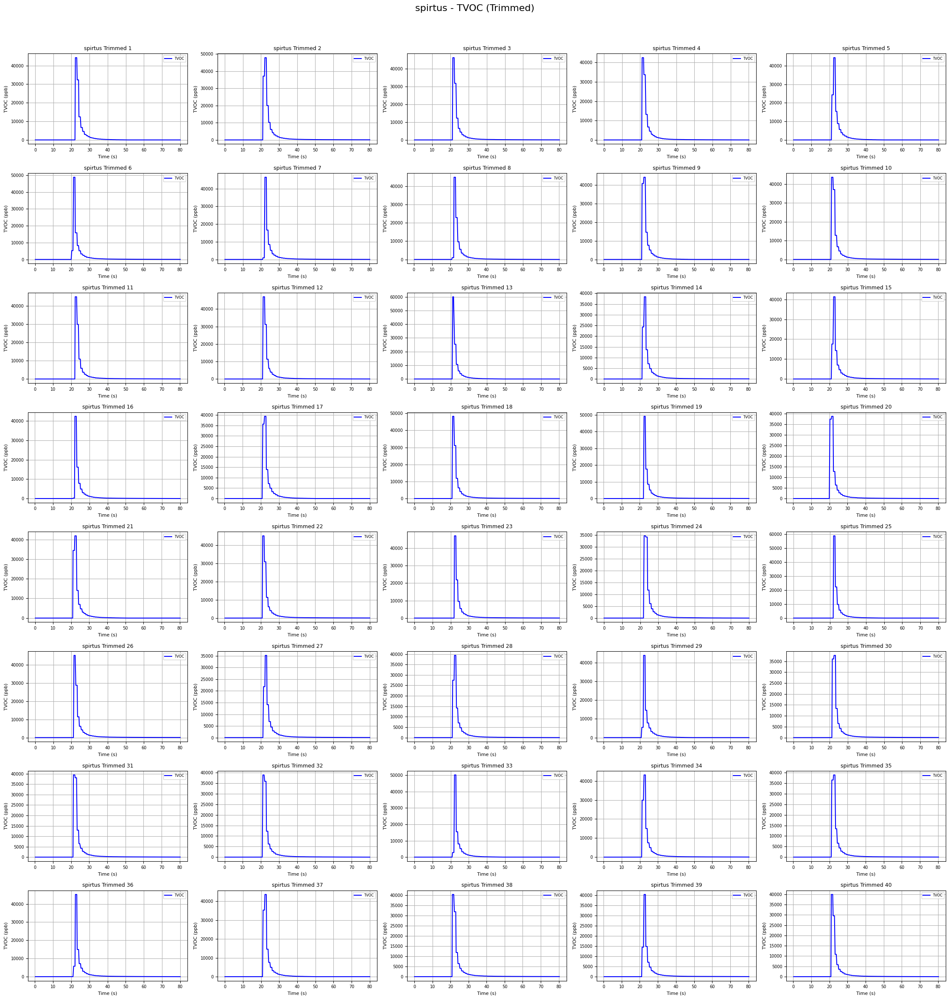

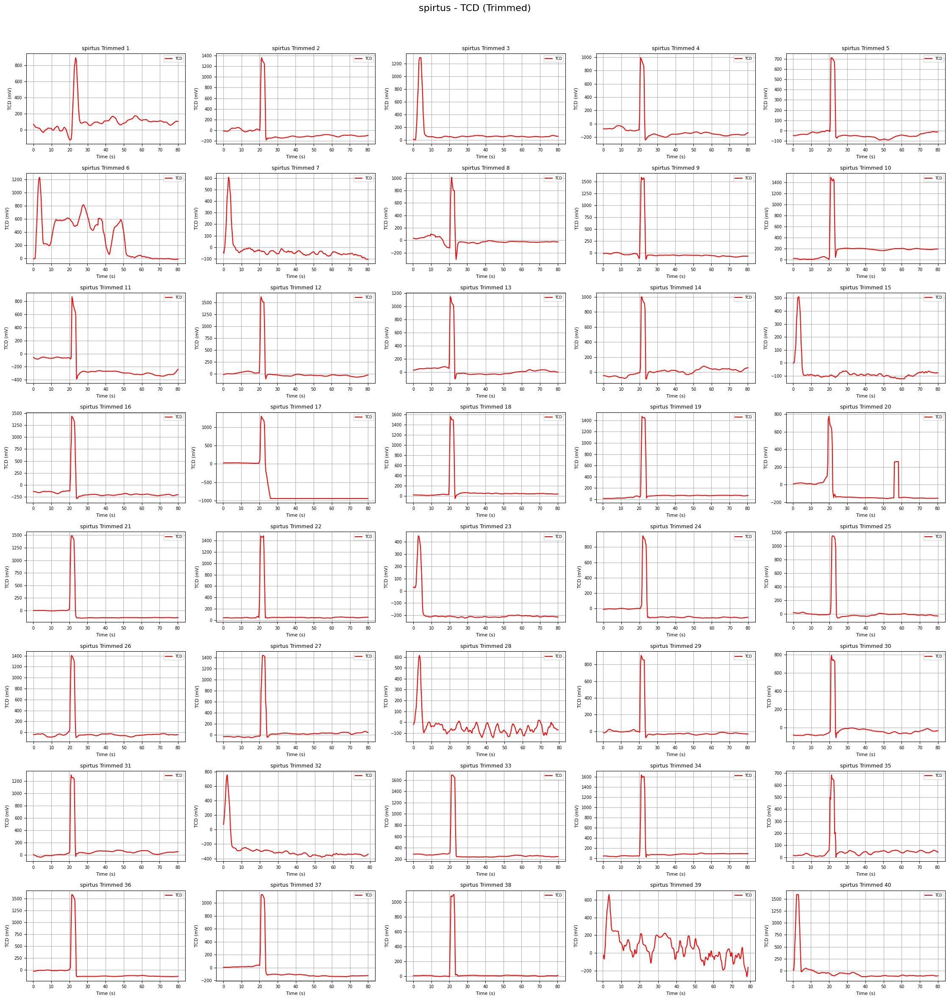

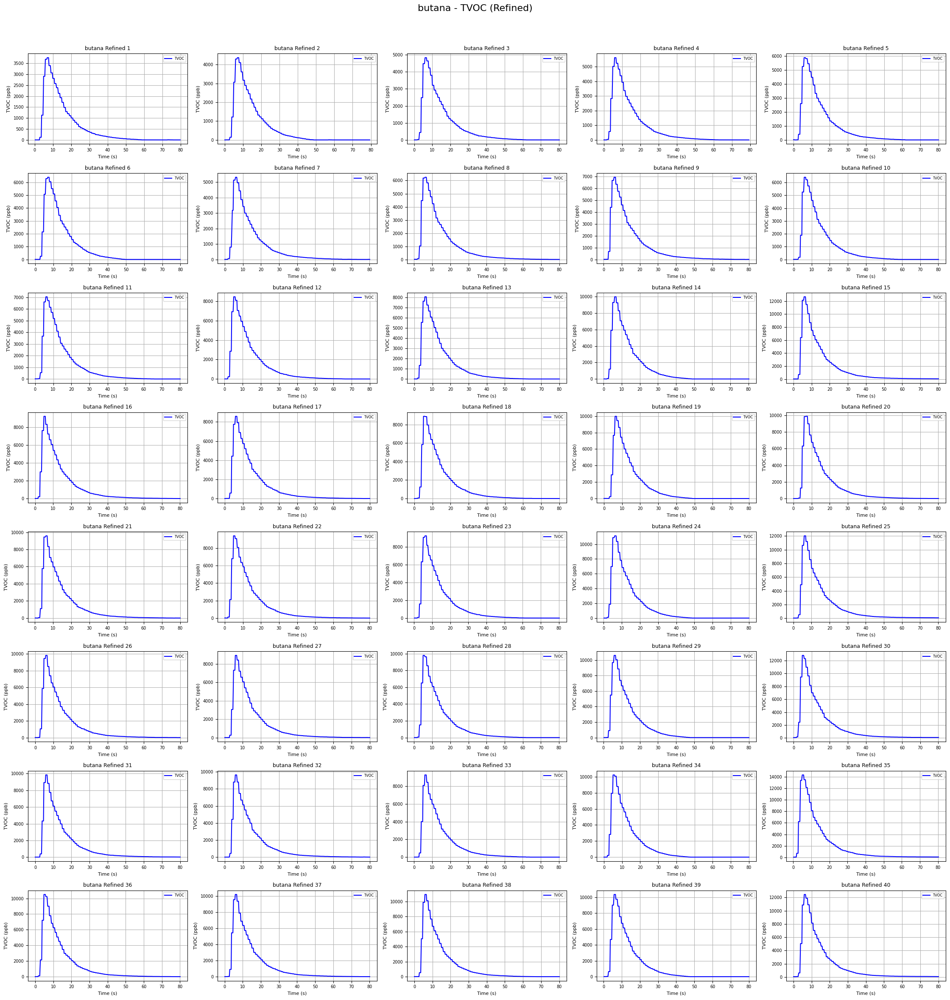

...

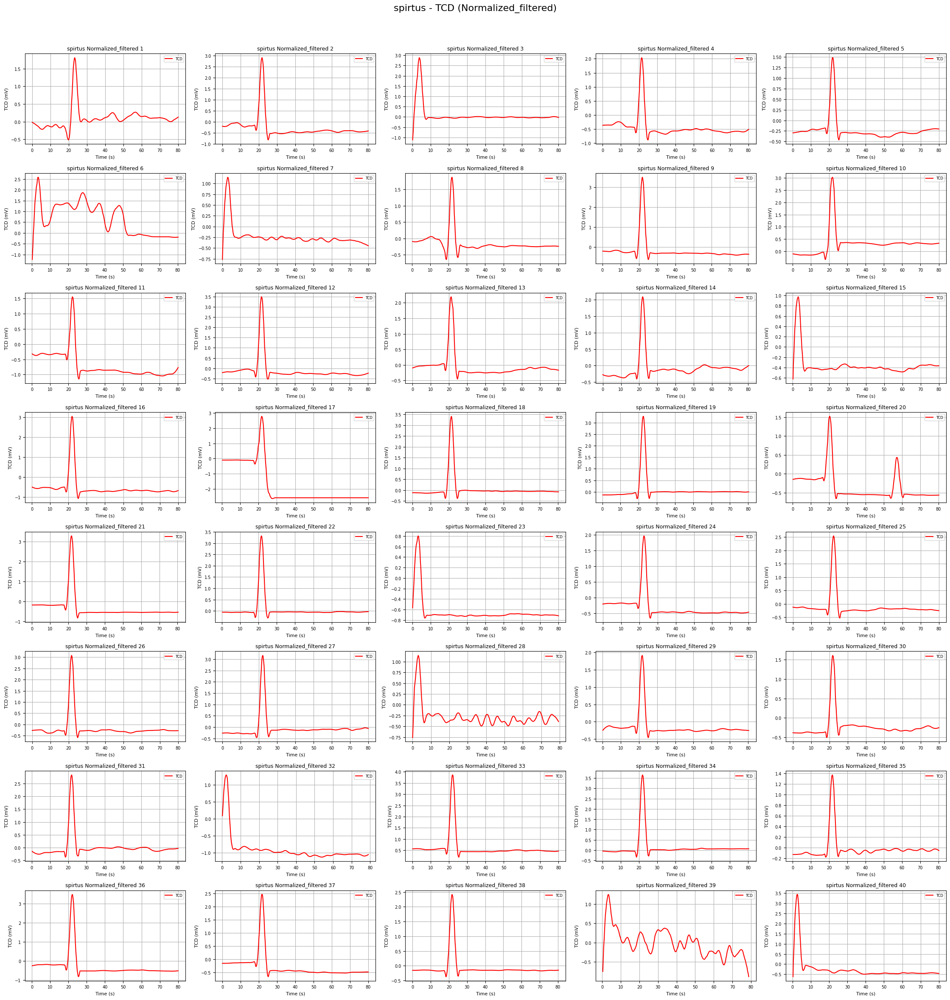

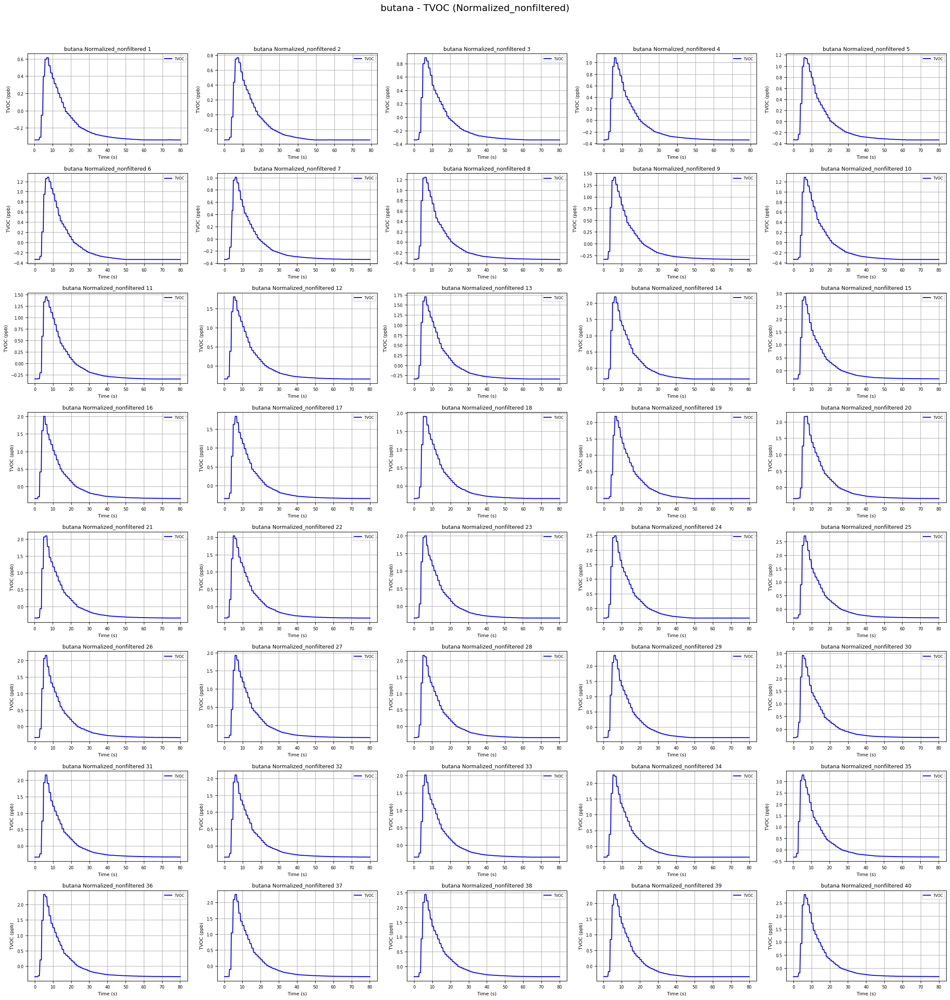

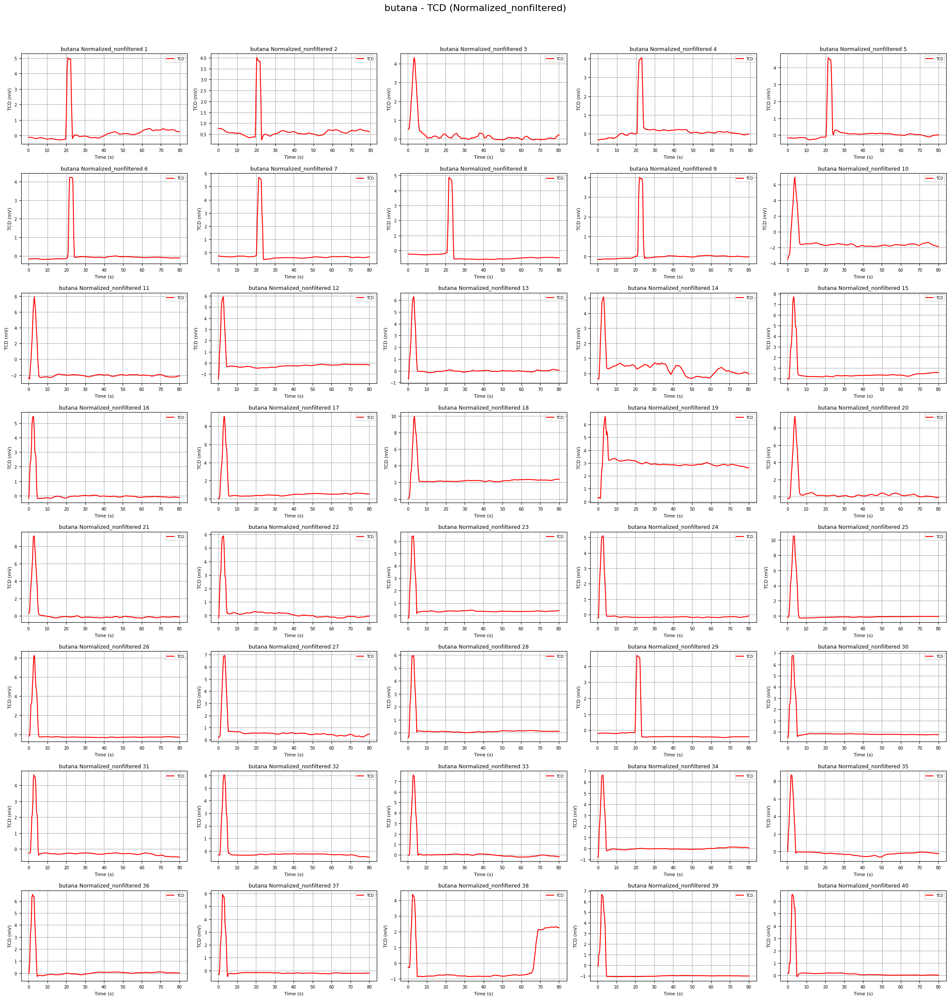

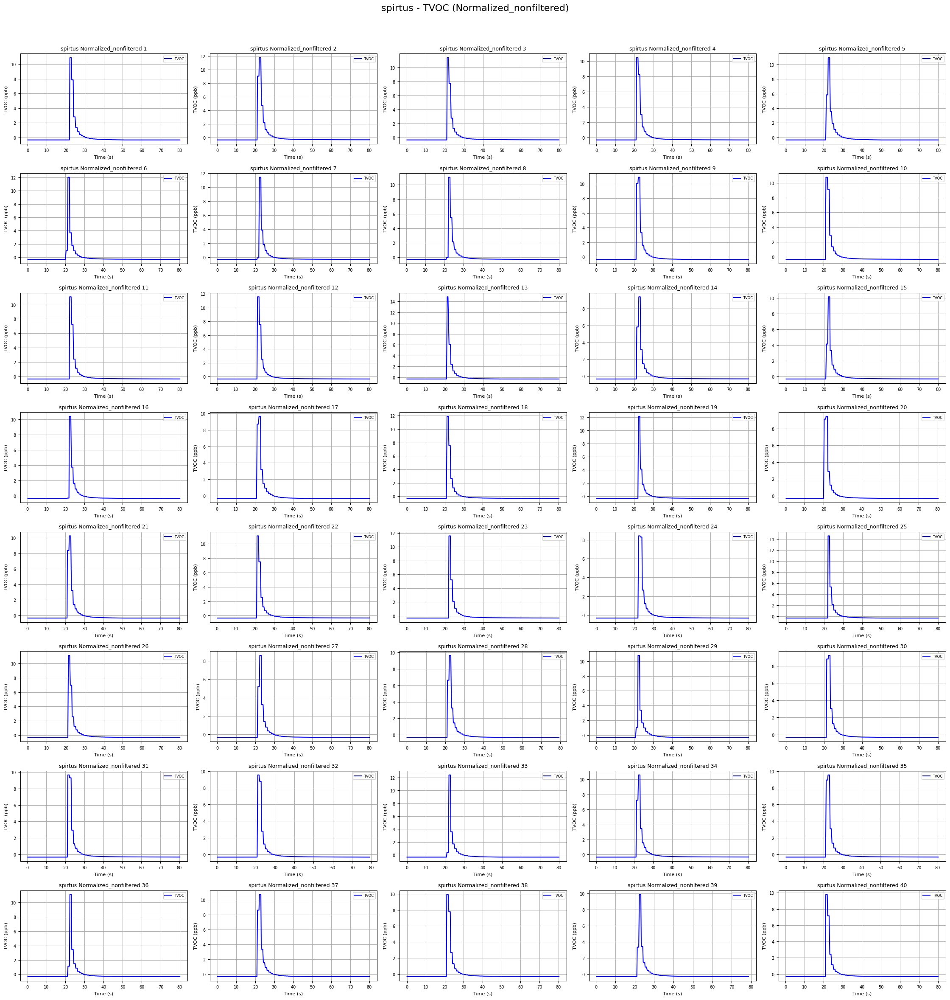

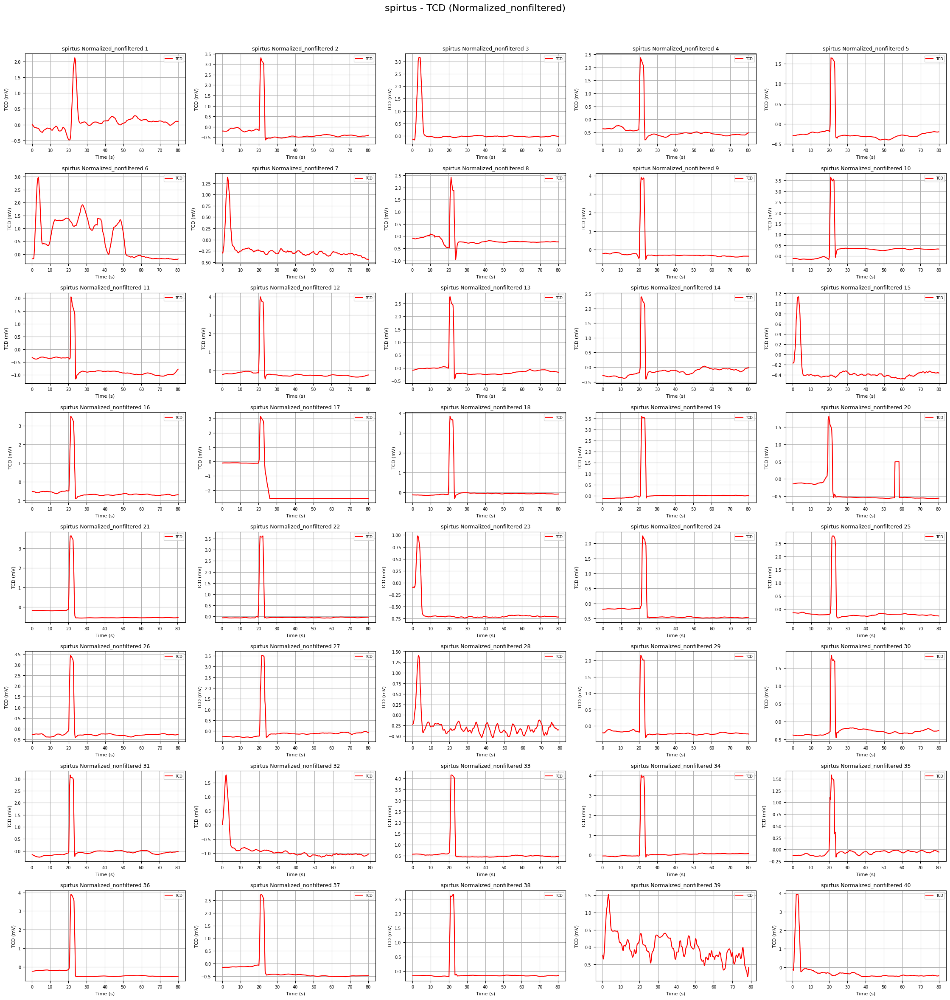

In [ ]:
# file = ['butana', 'spirtus']

# for stage in ['trimmed', 'refined', 'filtered', 'normalized_filtered', 'normalized_nonfiltered']:
#     for senyawa in file:
#         plot_grid(senyawa, 'TVOC', stage)
#         plot_grid(senyawa, 'TCD', stage)

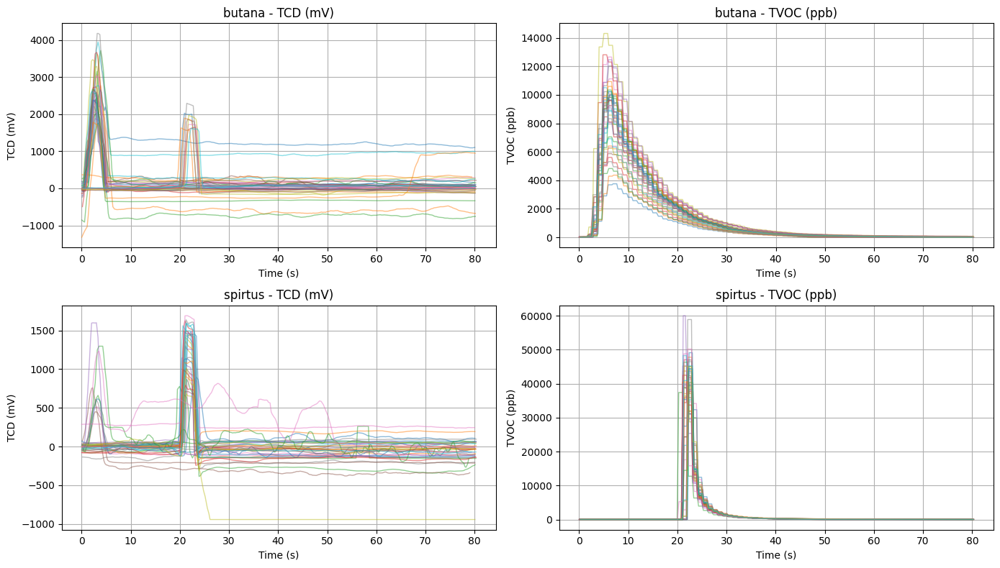

In [40]:
import os
import pandas as pd
import matplotlib.pyplot as plt

base_path = "../Data/trimmed"
senyawa_list = ["butana", "spirtus"]

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 8))
axes = axes.flatten()

for idx, senyawa in enumerate(senyawa_list):
    folder_path = os.path.join(base_path, senyawa)
    
    for file in os.listdir(folder_path):
        if file.endswith(".csv"):
            file_path = os.path.join(folder_path, file)
            df = pd.read_csv(file_path)

            # Plot TCD
            axes[idx*2].plot(df["Time (s)"], df["TCD (mV)"], alpha=0.5, linewidth=1)

            # Plot TVOC
            axes[idx*2 + 1].plot(df["Time (s)"], df["TVOC (ppb)"], alpha=0.5, linewidth=1)

    # Set judul dan label
    axes[idx*2].set_title(f"{senyawa} - TCD (mV)")
    axes[idx*2].set_xlabel("Time (s)")
    axes[idx*2].set_ylabel("TCD (mV)")
    axes[idx*2].grid(True)

    axes[idx*2 + 1].set_title(f"{senyawa} - TVOC (ppb)")
    axes[idx*2 + 1].set_xlabel("Time (s)")
    axes[idx*2 + 1].set_ylabel("TVOC (ppb)")
    axes[idx*2 + 1].grid(True)

plt.tight_layout()
plt.show()
